<font size="+8"><center>
    Notebook for neuron data
</center></font>
<font size="+2"><center>
    Meichen Fang, Gennady Gorin, and Lior Pachter
</center></font>

# Preparation and exploratory data analysis
## Load packages

In [1]:
cd ..

/home/mffang/workspace/FGP_2024


In [3]:
# Load before numpy to restrict its usage of cores, otherwise it will use all cores when doing @
import os
os.environ["BLAS_NUM_THREADS"] = "1" 
os.environ["OPENBLAS_NUM_THREADS"] = "1" # 

import Chronocell
print(Chronocell.__version__)

from Chronocell.inference import Trajectory
from Chronocell.mixtures import PoissonMixture
from Chronocell.utils import *
from Chronocell.plotting import *

2023.09.01


In [91]:
import scipy.stats as stats
from scipy.interpolate import UnivariateSpline, RBFInterpolator
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cmasher as cmr
from tqdm import tqdm
import copy

## Load data

!wget -O ./data/neuron_splicing.h5ad https://www.dropbox.com/s/g1afqdcsczgyj2m/neuron_splicing_4_11.h5ad?dl=1

!wget -O ./data/neuron_labeling.h5ad https://www.dropbox.com/s/lk9cl63yd28mfuq/neuron_labeling.h5ad?dl=1

In [4]:
neuron_splicing = sc.read('./data/neuron_splicing.h5ad')
neuron_splicing

AnnData object with n_obs × n_vars = 13476 × 44021
    obs: 'cellname'
    var: 'gene_short_name'
    layers: 'spliced', 'unspliced'

In [5]:
neuron_labeling = sc.read('./data/neuron_labeling.h5ad')
neuron_labeling

AnnData object with n_obs × n_vars = 3060 × 24078
    obs: 'cell_type', '4sU', 'treatment', 'time', 'cell_name'
    var: 'gene_short_name', 'activity_genes'
    layers: 'new', 'total'

In [6]:
cell_idx = neuron_labeling.obs_names.isin(neuron_splicing.obs_names)
alldata = neuron_labeling[cell_idx]
gene_idx = neuron_labeling.var_names.isin(neuron_splicing.var_names)
alldata = alldata[:,gene_idx]
alldata

View of AnnData object with n_obs × n_vars = 3060 × 23918
    obs: 'cell_type', '4sU', 'treatment', 'time', 'cell_name'
    var: 'gene_short_name', 'activity_genes'
    layers: 'new', 'total'

In [7]:
cell_idx = np.array([np.where(neuron_splicing.obs_names == cell)[0][0] for cell in alldata.obs_names],dtype=int)
gene_idx = np.array([np.where(neuron_splicing.var_names == gene)[0][0] for gene in alldata.var_names],dtype=int)
alldata.layers['spliced'] = neuron_splicing.layers['spliced'][cell_idx][:,gene_idx].copy()
alldata.layers['unspliced'] = neuron_splicing.layers['unspliced'][cell_idx][:,gene_idx].copy()

In [8]:
alldata.write_h5ad('data/neuron.h5ad')

In [361]:
from sklearn.decomposition import PCA

adata = sc.read('data/neuron.h5ad')
total_UMI = adata.X.toarray().sum(axis=1)
r = total_UMI/np.mean(total_UMI)
pca = PCA(n_components=2)
xx = pca.fit_transform(np.log(1+adata.X.toarray()/total_UMI[:,None]*np.mean(total_UMI)))
adata.obsm['X_pca'] = x

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


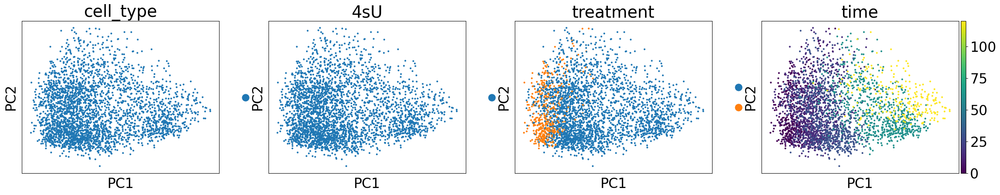

In [6]:
sc.pl.pca(adata,color=['cell_type', '4sU', 'treatment', 'time'])

## Check gene expression

In [7]:
adata.var_names

Index(['0610005C13Rik', '0610006L08Rik', '0610007P14Rik', '0610009B22Rik',
       '0610009E02Rik', '0610009L18Rik', '0610009O20Rik', '0610010F05Rik',
       '0610010K14Rik', '0610012G03Rik',
       ...
       'Zw10', 'Zwilch', 'Zwint', 'Zxdb', 'Zxdc', 'Zyg11a', 'Zyg11b', 'Zyx',
       'Zzef1', 'Zzz3'],
      dtype='object', name='index', length=23918)

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


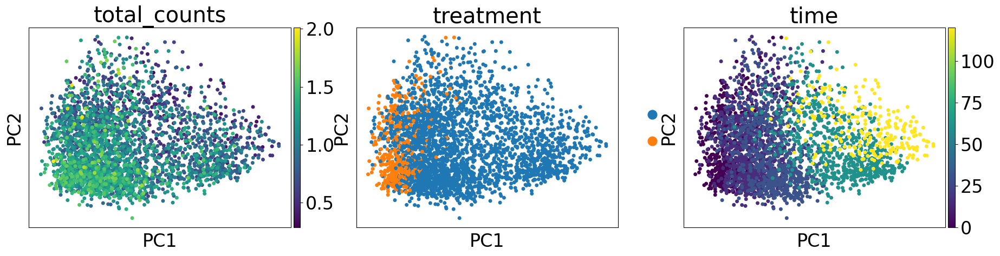

In [8]:
adata.X = adata.layers['new']
adata.obs['total_counts'] = adata.X.mean(1)/adata.X.mean()
sc.pl.pca(adata,color=['total_counts','treatment','time'],s=100)

**scNT fig 3 genes**

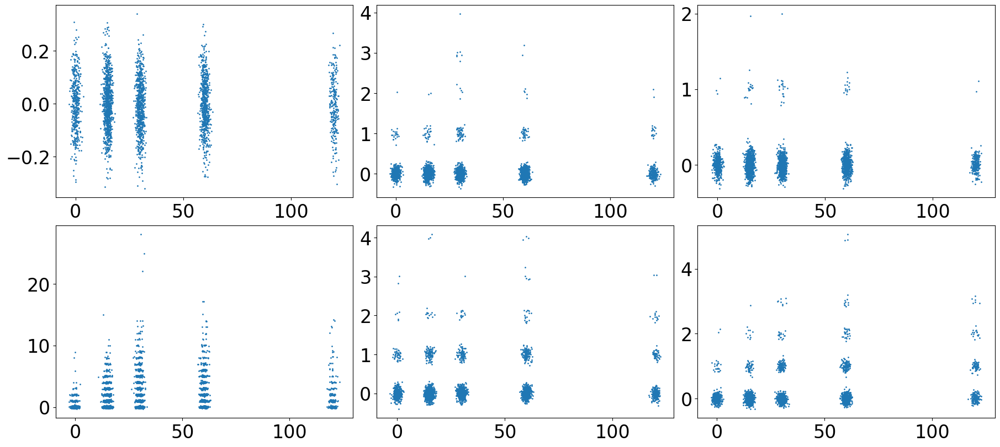

In [9]:
plot_marker_genes = ['Jun','Mef2d','Maff']
fig, ax = plt.subplots(2,3,figsize=(18,8))
for i in range(len(plot_marker_genes)):
    j = np.where(adata.var_names == plot_marker_genes[i])[0][0]
    ax[0,i].scatter(adata.obs.time+np.random.normal(0,1,adata.n_obs),adata.layers['unspliced'].toarray()[:,j]+np.random.normal(0,0.1,adata.n_obs),s=1)
    ax[1,i].scatter(adata.obs.time+np.random.normal(0,1,adata.n_obs),adata.layers['spliced'].toarray()[:,j]+np.random.normal(0,0.1,adata.n_obs),s=1)

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/IPython/core/events.py:89: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  func(*args, **kwargs)


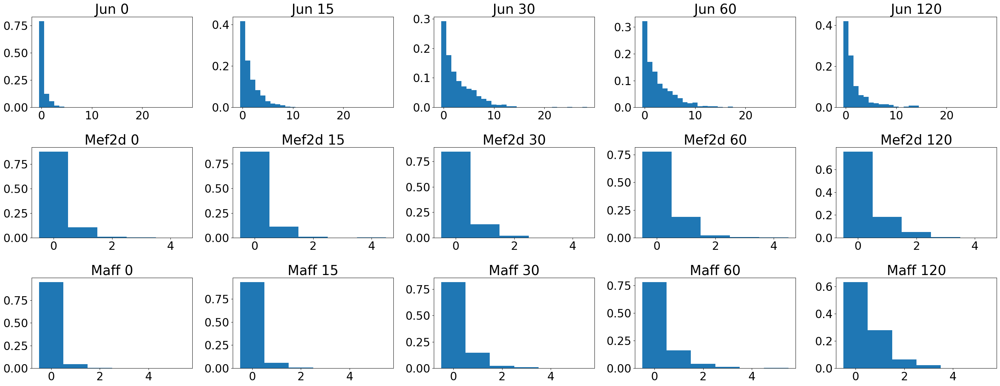

In [10]:
plot_marker_genes = ['Jun','Mef2d','Maff']
fig, ax = plt.subplots(3,5,figsize=(30,12),tight_layout=True)
for i in range(len(plot_marker_genes)):
    j = np.where(adata.var_names == plot_marker_genes[i])[0][0]
    bins = np.arange(-0.5,adata.layers['spliced'].toarray()[:,j].max()+1.5,1)
    for ii,t in enumerate([0, 15, 30, 60, 120]):
        ax[i,ii].hist(adata.layers['spliced'].toarray()[adata.obs.time==t,j],bins=bins,density=True)
        ax[i,ii].set_title(plot_marker_genes[i]+' '+str(t))

In [12]:
IEG = ['Fos', 'Fosb', 'Junb', 'Egr1', 'Nr4a1','Npas4']
LRG = ['Bdnf','Nptx2','Grasp','Igf1','Hdac9']
Fig3G = ['Jun','Mef2d','Maff']
marker_genes = adata.var_names[adata.var_names.isin(IEG + LRG + Fig3G + ['Neurod6','Gad1','Dlx1','Dlx2','Nes','Sox2','Aldh1l1','Arc','Npas4', 'c-Fos','Egr1'])]

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


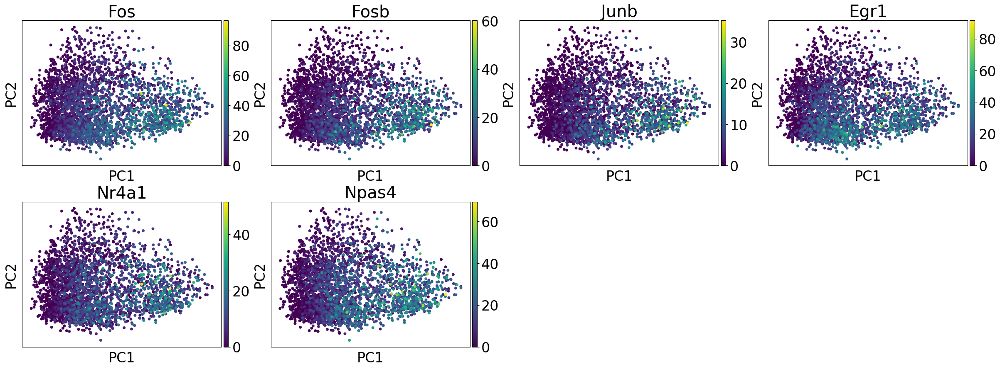

In [13]:
sc.pl.pca(adata,color=IEG,s=100)

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


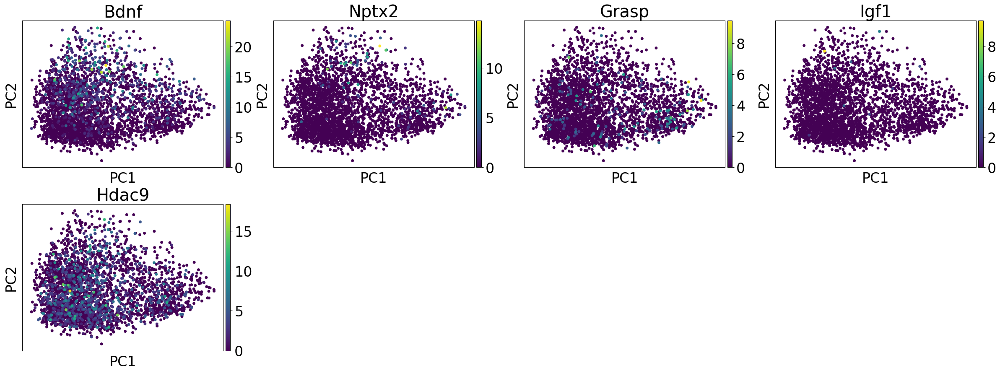

In [14]:
sc.pl.pca(adata,color=LRG,s=100)

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/IPython/core/pylabtools.py:152: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.canvas.print_figure(bytes_io, **kw)


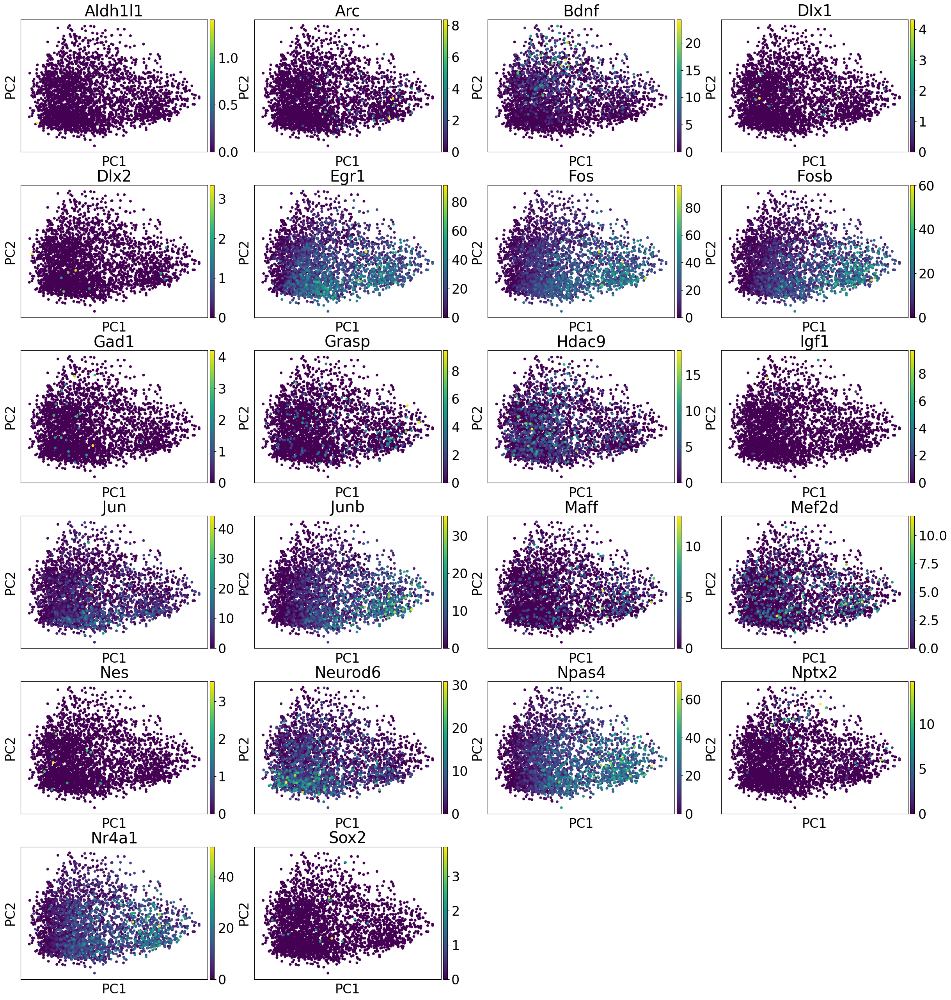

In [15]:
sc.pl.pca(adata,color=marker_genes,s=100)

**Define marker genes and load gene length data**

In [16]:
gene_length_file = np.loadtxt("data/gg_200524_mouse_genome_polyA_cum_1.txt",dtype="str")
gene_length = np.array([int(gene[1]) for gene in gene_length_file])
gene_name = np.array([gene[0] for gene in gene_length_file])
print(np.sum(adata.var_names.isin(gene_name)))

22406


**Define clusters and cell colors**

In [239]:
clusters = adata.obs['time']/60
set(clusters)

{0.0, 0.25, 0.5, 1.0, 2.0}

In [240]:
Clusters = [0.0, 0.25, 0.5, 1.0, 2.0]

In [365]:
color_palette = ["#d1e2e5","#BAD4D8","#a2c5ca","#74A8AF","#458b94","#2a606b","#0e3442"]
cmap_teal = LinearSegmentedColormap.from_list("Teals", color_palette, N=5)
cmap_cluster = cmap_teal

cell_colors = np.zeros((adata.n_obs,3))

for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    cell_colors[idx] = cmap_cluster(i)[:3]

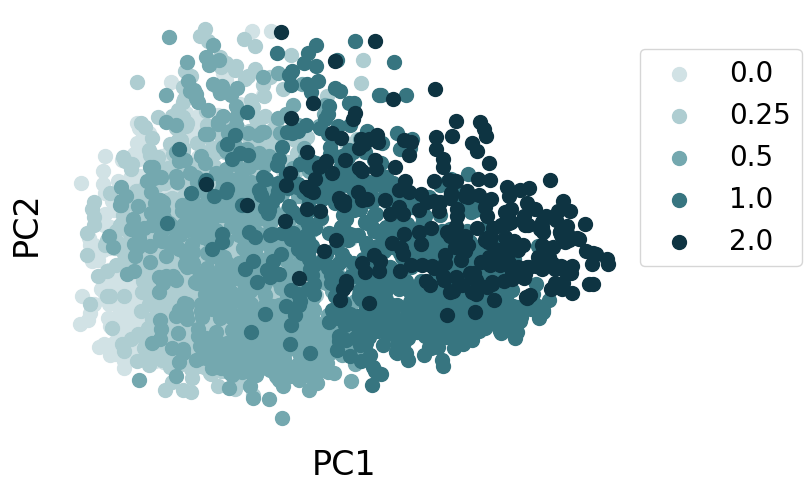

In [375]:
fig, ax = plt.subplots(1,1,figsize=(8,4.8))
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    ax.scatter(xx[idx,0],xx[idx,1],color=cmap_cluster(i),label=Cluster,s=100);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.legend(loc=(1.01,0.4))

## Gene variances

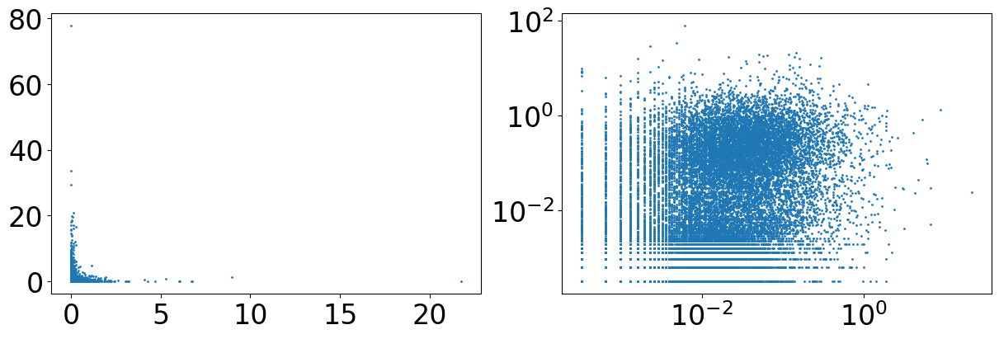

In [21]:
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].scatter(adata.layers['unspliced'].toarray().mean(0),adata.layers['spliced'].toarray().mean(0),s=1)
ax[1].scatter(adata.layers['unspliced'].toarray().mean(0),adata.layers['spliced'].toarray().mean(0),s=1)
ax[1].set_xscale('log')
ax[1].set_yscale('log')

In [22]:
idx = (adata.layers["unspliced"].toarray().mean(0) > 0) 
U = adata.layers["unspliced"][:,idx].toarray()
n,p = U.shape
X = U
X_cov = np.cov(X,rowvar=False)
X_mean = np.mean(X,axis=0)
X_rho = X_cov/X_mean[:,None]/X_mean[None,:]
su = (np.sum(X_rho)-np.sum(np.diag(X_rho)))/((p-1)*p)
print("s estimated by normalized covariance of total U counts =", str(su))


idx = adata.layers["spliced"].toarray().mean(0) > 0
S = adata.layers["spliced"][:,idx].toarray()
n,p = S.shape
X = S
X_cov = np.cov(X,rowvar=False)
X_mean = np.mean(X,axis=0)
X_rho = X_cov/X_mean[:,None]/X_mean[None,:]
ss = (np.sum(X_rho)-np.sum(np.diag(X_rho)))/((p-1)*p)
print("s estimated by normalized covariance of total S counts =", str(ss))

idx = (adata.layers["spliced"].toarray().mean(0) > 0) | (adata.layers["unspliced"].toarray().mean(0) > 0)
U=adata.layers["unspliced"][:,idx].toarray()
S=adata.layers["spliced"][:,idx].toarray()
X = S + U
n,p = X.shape
X_cov = np.cov(X,rowvar=False)
X_mean = np.mean(X,axis=0)
X_rho = X_cov/X_mean[:,None]/X_mean[None,:]
s1 = (np.sum(X_rho)-np.sum(np.diag(X_rho)))/((p-1)*p)
print("s estimated by normalized covariance of total counts =", str(s1))

X = U + S
X_total = X.sum(1)
s2 = (X_total.var()-X_total.mean())/X_total.mean()**2
print("s estimated by total counts =", str(s2))

s estimated by normalized covariance of total U counts = 0.1148553223574574
s estimated by normalized covariance of total S counts = 0.0894457368049688
s estimated by normalized covariance of total counts = 0.09046226774928326
s estimated by total counts = 0.07615544987956668


In [23]:
a=1
sp=s1

X_bar = np.mean(X,axis=0)
X_var = np.var(X,axis=0)
for i in range(5):
    Pgene_mask = (X_mean > 0.01) & (X_var/(a*X_mean + sp*X_mean**2) < 1.2)   
    P = (S + U)[:,Pgene_mask]
    n,p = P.shape
    P_cov = np.cov(P,rowvar=False)
    P_mean = np.mean(P,axis=0)
    P_rho = P_cov/P_mean[:,None]/P_mean[None,:]
    sp = (np.sum(P_rho)-np.sum(np.diag(P_rho)))/((p-1)*p)
    print(Pgene_mask.mean(),"s:", str(sp))

0.4371738764517758 s: 0.09326352552485347
0.4403299107894294 s: 0.09306961321737836
0.4401615889580879 s: 0.09307313634471512
0.4401615889580879 s: 0.09307313634471512
0.4401615889580879 s: 0.09307313634471512


/tmp/ipykernel_1464970/814699658.py:15: RuntimeWarning: divide by zero encountered in divide
  ax[1].plot(np.sort(U_mean), a/np.sort(U_mean) + sp, color='#c74546', linewidth=8, zorder=0)
/tmp/ipykernel_1464970/814699658.py:16: RuntimeWarning: invalid value encountered in divide
  ax[1].scatter(U_mean, U_var/U_mean**2,c='lightgray',alpha=1, s=20, label='other genes')
/tmp/ipykernel_1464970/814699658.py:17: RuntimeWarning: invalid value encountered in divide
  ax[1].scatter(U_mean[Pgene_mask], U_var[Pgene_mask]/U_mean[Pgene_mask]**2, s=20, c='gray')
/tmp/ipykernel_1464970/814699658.py:22: RuntimeWarning: divide by zero encountered in divide
  ax[2].plot(np.sort(S_mean), a/np.sort(S_mean) + sp, color='#c74546', linewidth=8, zorder=0, label='baseline (1/x+'+str(np.around(sp,2))+")")
/tmp/ipykernel_1464970/814699658.py:23: RuntimeWarning: invalid value encountered in divide
  ax[2].scatter(S_mean, S_var/S_mean**2,c='lightgray',alpha=1, s=20, label='other genes')
/tmp/ipykernel_1464970/81469

Text(0.02, 0.5, 'CV$^2$')

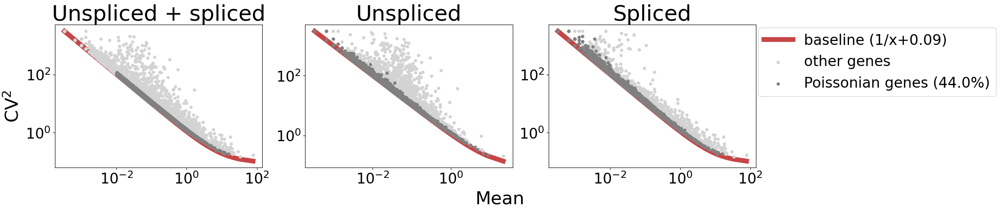

In [24]:
S_mean = np.mean(S,axis=0)
U_mean = np.mean(U,axis=0)
S_var = np.var(S,axis=0)
U_var = np.var(U,axis=0)

fig, ax = plt.subplots(1,3,figsize=(23,4.8))

ax[0].plot(np.sort(X_mean), a/np.sort(X_mean) + sp, color='#c74546', linewidth=8, zorder=0)
ax[0].scatter(X_mean, X_var/X_mean**2,c='lightgray',alpha=1, s=20)
ax[0].scatter(X_mean[Pgene_mask], X_var[Pgene_mask]/X_mean[Pgene_mask]**2, s=20, c='gray')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('Unspliced + spliced',fontsize=title_font)

ax[1].plot(np.sort(U_mean), a/np.sort(U_mean) + sp, color='#c74546', linewidth=8, zorder=0)
ax[1].scatter(U_mean, U_var/U_mean**2,c='lightgray',alpha=1, s=20, label='other genes')
ax[1].scatter(U_mean[Pgene_mask], U_var[Pgene_mask]/U_mean[Pgene_mask]**2, s=20, c='gray')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_title('Unspliced',fontsize=title_font)

ax[2].plot(np.sort(S_mean), a/np.sort(S_mean) + sp, color='#c74546', linewidth=8, zorder=0, label='baseline (1/x+'+str(np.around(sp,2))+")")
ax[2].scatter(S_mean, S_var/S_mean**2,c='lightgray',alpha=1, s=20, label='other genes')
ax[2].scatter(S_mean[Pgene_mask], S_var[Pgene_mask]/S_mean[Pgene_mask]**2, s=20, c='gray', label='Poissonian genes ('+str(np.around(100*np.sum(Pgene_mask)/len(X_bar),1))+"%)")
ax[2].set_xscale('log')
ax[2].set_yscale('log')
ax[2].set_title('Spliced',fontsize=title_font)

ax[2].legend(loc=(1.01,0.5),fontsize=legend_font)
fig.supxlabel('Mean',fontsize=label_font)
fig.supylabel(r'CV$^2$',fontsize=label_font)

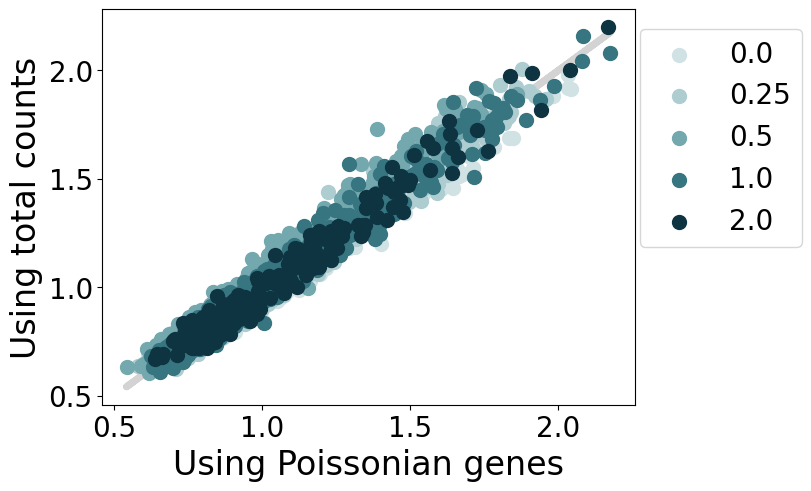

In [383]:
rd = (U + S)[:,Pgene_mask].mean(1)/(U + S)[:,Pgene_mask].mean()
rd_ = X_total/X_total.mean()
fig, ax = plt.subplots(1,1,figsize=(8,4.8))
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    ax.scatter(rd[idx],rd_[idx],color=cmap_teal(i),alpha=1,s=100,label=Cluster)
ax.plot(rd,rd,color='lightgray',zorder=0)
plt.xlabel('Using Poissonian genes',fontsize=legend_font)
plt.ylabel('Using total counts',fontsize=legend_font)
plt.legend(loc=(1.01,0.4))

## Select genes

In [42]:
var_threshold = 1.25
U_mean = adata.layers["unspliced"].toarray().mean(0)
S_mean = adata.layers["spliced"].toarray().mean(0)
U_var = adata.layers["unspliced"].toarray().var(0)
S_var = adata.layers["spliced"].toarray().var(0)
fitted_idx = (U_mean > 0.1) & (S_mean > 0.5) \
    & (U_var/(a*U_mean + su*U_mean**2) > var_threshold) \
    & (S_var/(a*S_mean + ss*S_mean**2) > var_threshold)  
fitted_genes=adata.var_names[fitted_idx]
len(fitted_genes)

/tmp/ipykernel_1464970/1945954217.py:7: RuntimeWarning: invalid value encountered in divide
  & (U_var/(a*U_mean + su*U_mean**2) > var_threshold) \
/tmp/ipykernel_1464970/1945954217.py:8: RuntimeWarning: invalid value encountered in divide
  & (S_var/(a*S_mean + ss*S_mean**2) > var_threshold)


107

In [43]:
cell_cycle_genes = np.loadtxt("data/cell_cycle_genes.txt",dtype="str")
fitted_genes = fitted_genes[~fitted_genes.isin(cell_cycle_genes)]
len(fitted_genes)

101

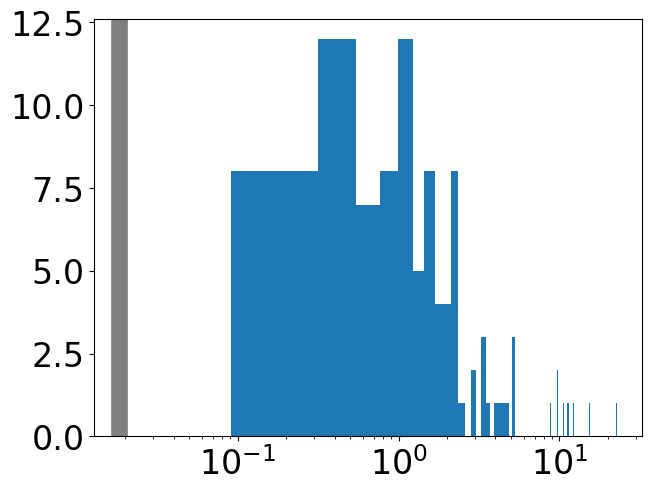

In [44]:
fitted_genes = fitted_genes[fitted_genes.isin(gene_name)]
fitted_idx = adata.var_names.isin(fitted_genes)

Ub_gene_idx = np.array([ np.where(gene_name == fitted_gene)[0][0]  for fitted_gene in fitted_genes ],dtype=int)
Ub = 10**(-5)*gene_length[Ub_gene_idx]
plt.hist(Ub,bins=100);
plt.xscale('log')
plt.axvline(x=np.e**(-4),color='gray');

/tmp/ipykernel_1464970/3805144832.py:3: RuntimeWarning: invalid value encountered in divide
  ax[0].scatter(S_mean, S_var/S_mean**2,c='lightgray',alpha=1, s=10)
/tmp/ipykernel_1464970/3805144832.py:4: RuntimeWarning: divide by zero encountered in divide
  ax[0].scatter(S_mean, a/S_mean + sp, c='#c74546', alpha=0.5, s=20)
/tmp/ipykernel_1464970/3805144832.py:11: RuntimeWarning: invalid value encountered in divide
  ax[1].scatter(U_mean, U_var/U_mean**2,c='lightgray',alpha=1, s=10, label='other genes')
/tmp/ipykernel_1464970/3805144832.py:12: RuntimeWarning: divide by zero encountered in divide
  ax[1].scatter(U_mean, a/U_mean + sp, c='#c74546', alpha=0.5, s=20, label='variance baseline')


Text(0.02, 0.5, 'Variance')

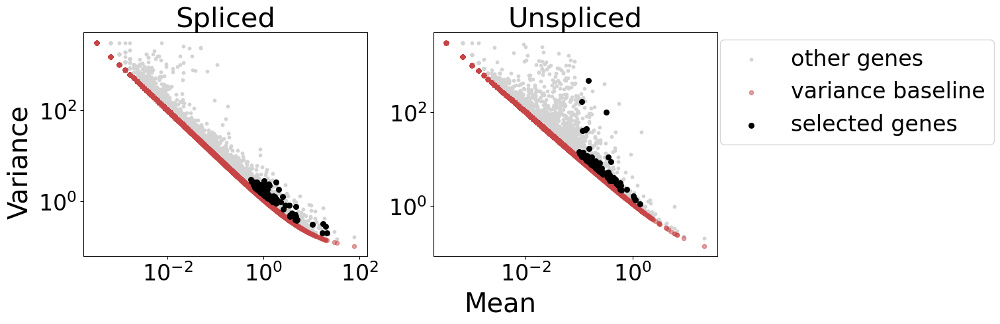

In [45]:
fig, ax = plt.subplots(1,2,figsize=(15,4.8))

ax[0].scatter(S_mean, S_var/S_mean**2,c='lightgray',alpha=1, s=10)
ax[0].scatter(S_mean, a/S_mean + sp, c='#c74546', alpha=0.5, s=20)
ax[0].scatter(S_mean[fitted_idx], S_var[fitted_idx]/S_mean[fitted_idx]**2, s=30, c='k')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('Spliced',fontsize=label_font)


ax[1].scatter(U_mean, U_var/U_mean**2,c='lightgray',alpha=1, s=10, label='other genes')
ax[1].scatter(U_mean, a/U_mean + sp, c='#c74546', alpha=0.5, s=20, label='variance baseline')
ax[1].scatter(U_mean[fitted_idx], U_var[fitted_idx]/U_mean[fitted_idx]**2, s=30, c='k', label='selected genes')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].legend(loc=(1.01,0.5),fontsize=legend_font)
ax[1].set_title('Unspliced',fontsize=label_font)
fig.supxlabel('Mean')
fig.supylabel('Variance')

In [46]:
fitted_idx = adata.var_names.isin(fitted_genes)

X=np.zeros((n,fitted_idx.sum(),2))
X[:,:,0]=adata.layers["unspliced"][:,fitted_idx].toarray()
X[:,:,1]=adata.layers["spliced"][:,fitted_idx].toarray()
fitted_genes=adata.var_names[fitted_idx]
print(X.mean((0,1)))
X.shape

[0.29326731 2.33421702]


(3060, 98, 2)

In [47]:
plot_idx = [np.where(fitted_genes==gene)[0] for gene in marker_genes]
plot_idx = np.concatenate(plot_idx).ravel()
print(fitted_genes[plot_idx])

Index(['Hdac9'], dtype='object', name='index')


TypeError: 'AxesSubplot' object is not subscriptable

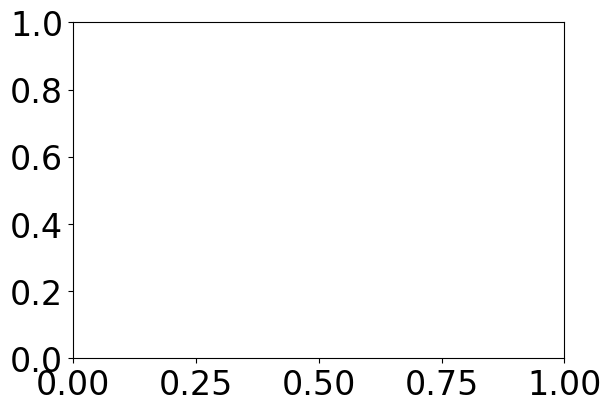

In [48]:
pp = min(10,len(plot_idx))
fix, ax = plt.subplots(1,pp,figsize=(6*pp,4))
for i in range(pp):
    j = plot_idx[i]
    ax[i].set_title(fitted_genes[j])
    ax[i].scatter(X[:,j,0]+np.random.normal(0,0.1,X.shape[0]),X[:,j,1]+np.random.normal(0,0.1,X.shape[0]),s=0.5,alpha=0.5) #,c=adata.obs['louvain'])

## Mixtures fitting

1 -232.70921032526215 -232.77326261284384 -232.96625760601535
2 -229.29569454909335 -229.42412592164237 -229.81110057631787
3 -226.62085453082847 -226.8136649883448 -227.39461930452427
4 -225.53913683043572 -225.7963263729194 -226.57126035060284


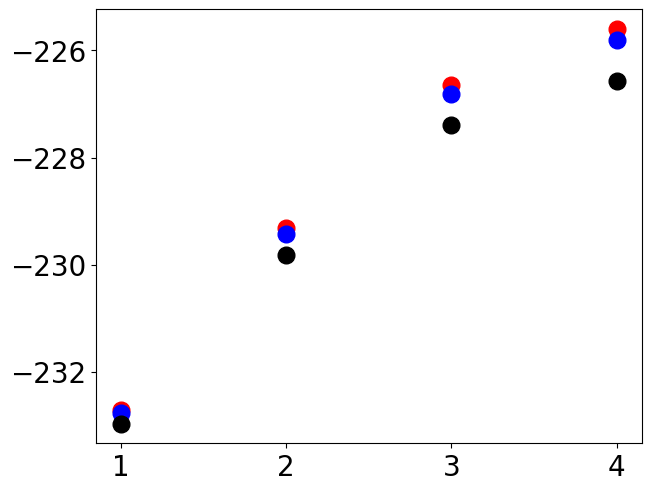

In [178]:
PMs = []
for nc in range(1,5):
    PM = PoissonMixture(n_components=nc,verbose=0)
    Q, elbo = PM.fit(X,warm_start=False,read_depth=rd,epoch=5,n_init=3)
    PMs.append(PM)
    plt.scatter(nc,elbo,color='r')
    plt.scatter(nc,PM.compute_AIC(X),color='b')
    plt.scatter(nc,PM.compute_BIC(X),color='k')
    print(nc,PM.compute_lower_bound(X),PM.compute_AIC(X),PM.compute_BIC(X))

array([0.45121389, 0.54878611])

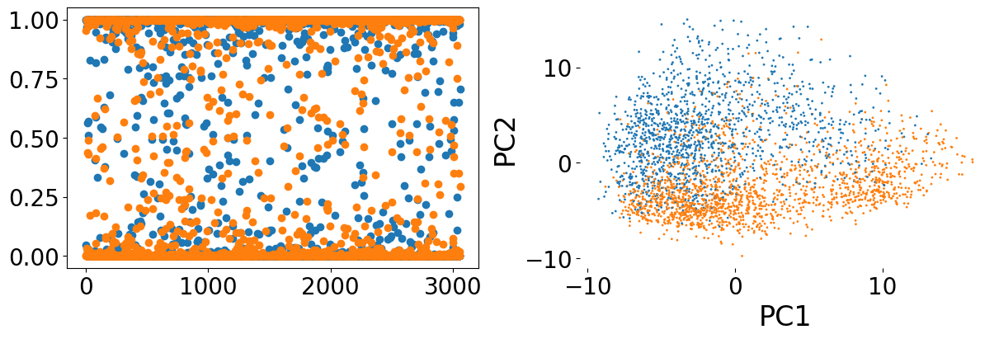

In [182]:
PM = PoissonMixture(n_components=2,verbose=0)
Q, elbo = PM.fit(X,warm_start=False,read_depth=rd,epoch=10,n_init=5)
tab_colors = plt.cm.tab10(np.arange(10))
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(Q[np.argsort(clusters)],'.');
ax[1].scatter(x_pca[:,0],x_pca[:,1],c=tab_colors[np.argmax(Q,axis=1)],s=1);
ax[1].set_xlabel('PC1',fontsize=24)
ax[1].set_ylabel('PC2',fontsize=24)
ax[1].set_frame_on(False)
PM.weights

array([0.41914595, 0.37784348, 0.20301056])

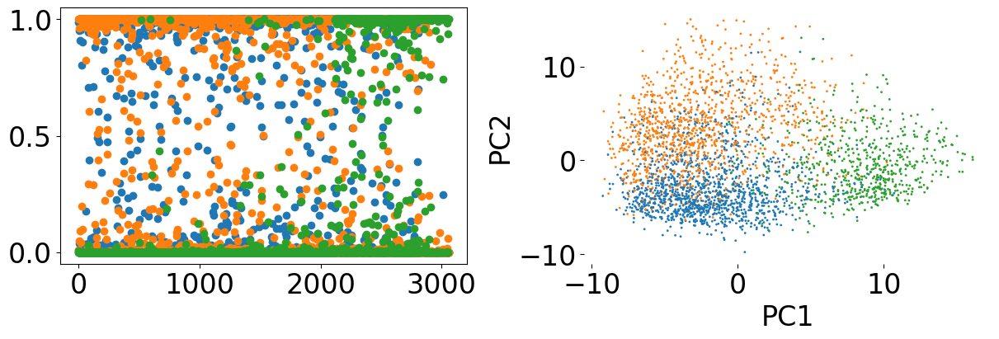

In [51]:
PM = PoissonMixture(n_components=3,verbose=0)
Q, elbo = PM.fit(X,warm_start=False,read_depth=rd,epoch=10,n_init=5)
tab_colors = plt.cm.tab10(np.arange(10))
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(Q[np.argsort(clusters)],'.');
ax[1].scatter(x[:,0],x[:,1],c=tab_colors[np.argmax(Q,axis=1)],s=1);
ax[1].set_xlabel('PC1',fontsize=24)
ax[1].set_ylabel('PC2',fontsize=24)
ax[1].set_frame_on(False)
PM.weights

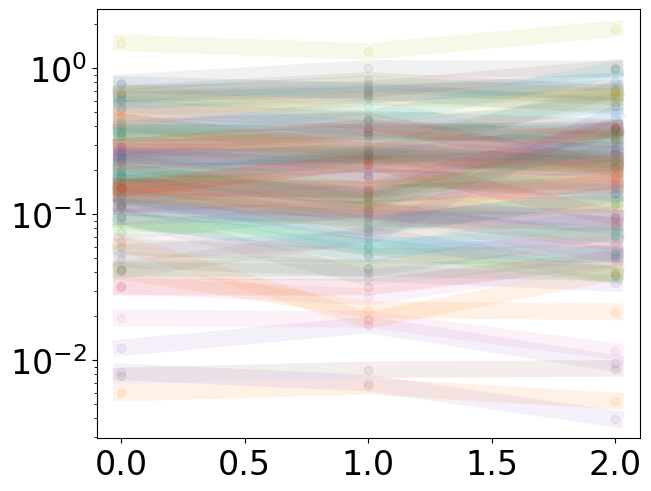

In [52]:
gbr = PM.theta[:,:,0]/PM.theta[:,:,1]

plt.plot(gbr,'.-',alpha=0.1);
plt.yscale('log')

# Trajectory fitting

In [53]:
elbos = {}
traj_params={'r':rd,"lambda_tau":0,"lambda_a":0}
x_pca = adata.obsm['X_pca']
x = x_pca

## Delta prior

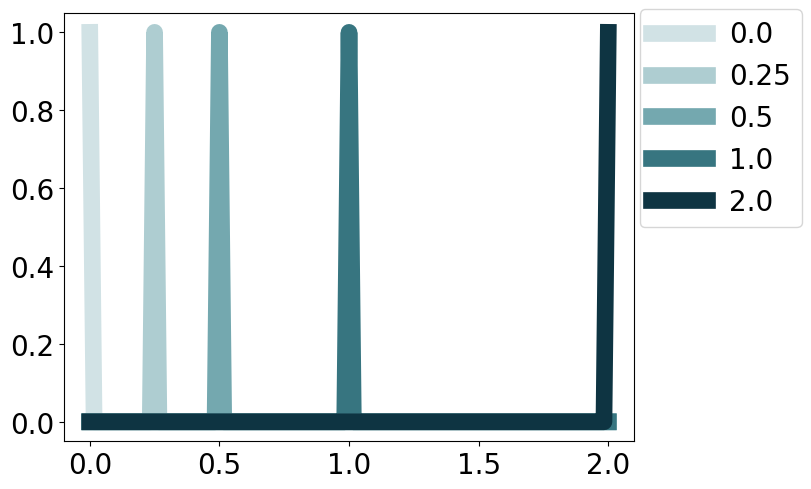

In [295]:
m=121
weight0 = np.zeros((adata.n_obs,m))

for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    weight0[idx,int(60*Cluster)] += 1
weight0=weight0/weight0.sum(axis=1,keepdims=True)

fig, ax = plt.subplots(1,1,figsize=(8,4.8))
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    ax.plot(traj.t,weight0[idx,:][0,:],label=Cluster,color=cmap_teal(i))
ax.legend(loc=(1.01,0.5))

Q0 = weight0[:,None]

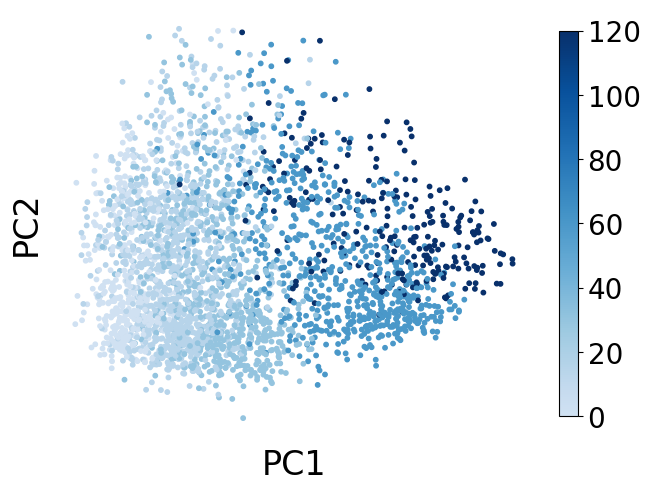

In [208]:
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=Q0.sum(1)@np.arange(m),cmap=cmap_y,s=10);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

In [58]:
topo = np.array([[0,1,2]])
tau = (0,1,2) # ~2 hours
traj = Trajectory(topo, tau, model="two_species_ss",verbose=1)
traj = traj.fit(X,warm_start=True,fit_tau=True,params=traj_params,Q=Q0,prior=Q0,parallel=True,n_threads=10,epoch=100)
print(traj.elbos[-1])
traj_delta = copy.deepcopy(traj)

Reminder: provide genewise unspliced to spliced capture rate ratio in params with key Ub
fitting with warm start


  0%|          | 0/100 [00:00<?, ?it/s]/home/mffang/workspace/Poisson-regression/RADOM/inference.py:185: RuntimeWarning: divide by zero encountered in log
  logL += np.log(self.weights)
 10%|█         | 10/100 [00:06<01:01,  1.46it/s]/home/mffang/workspace/Poisson-regression/RADOM/inference.py:259: RuntimeWarning: divide by zero encountered in log
  logL += np.log(self.weights)
100%|██████████| 100/100 [01:31<00:00,  1.09it/s]

-231.80041854948283


In [352]:
traj = copy.deepcopy(traj_delta)

[0.00000000e+00 1.26658384e-04 2.00000000e+00]


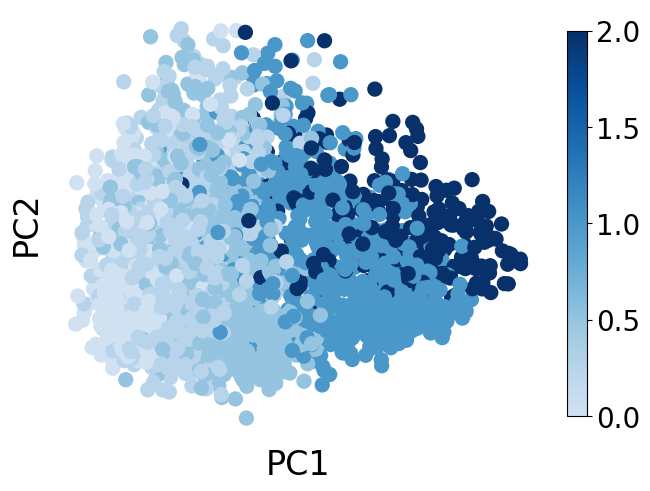

In [353]:
print(traj.tau)
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y,s=100);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

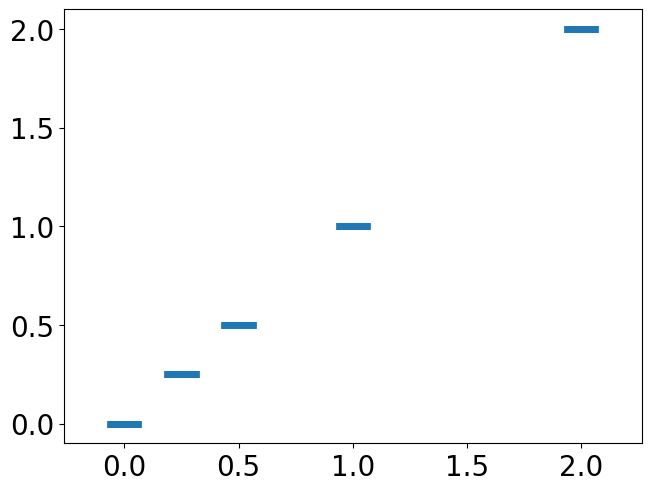

In [354]:
pos = Clusters
data=[]
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    data.append(traj.Q[idx,0]@traj.t)

plt.rcParams['lines.linewidth'] = 5.0
fig, axs = plt.subplots(1,1)
axs.violinplot(data, pos, widths=0.3,showmeans=True);

0.0
0.25
0.5
1.0
2.0


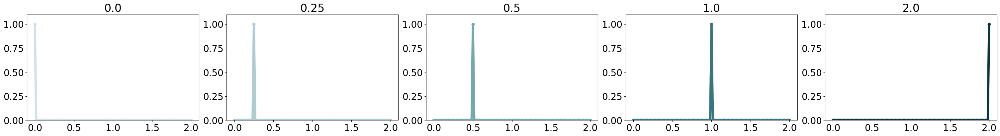

In [246]:
fig, ax = plt.subplots(1,len(Clusters),figsize=(6*len(Clusters),4))
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    ax[i].plot(traj.t,traj.Q[idx,0].mean(0),'.-',color=cmap_teal(i),linewidth=5)
    ax[i].set_title(stage)
    ax[i].set_ylim((0,1.1))
    print((traj.Q[idx,0]@traj.t).mean())

## Exponential prior

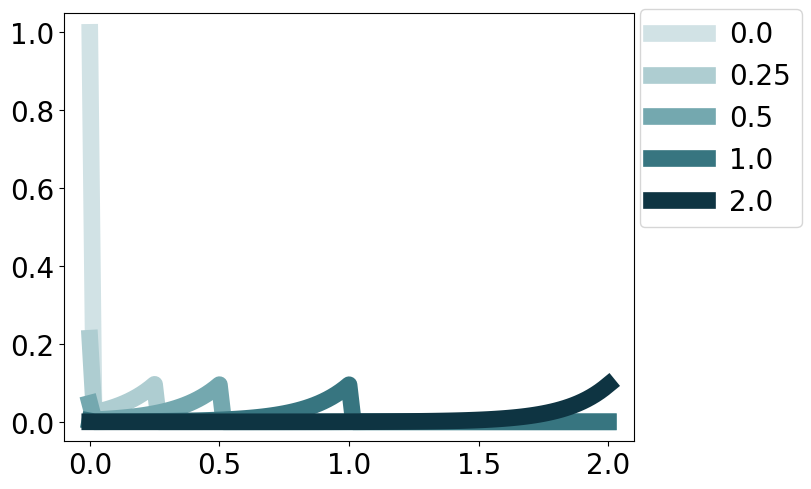

In [306]:
m=121
k=0.1
weight0 = np.zeros((adata.n_obs,m))
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    weight0[idx,:int(60*Cluster)+1] = np.exp(-k*np.arange(int(60*Cluster),-1,-1))*k
    weight0[idx,0] = np.exp(-k*int(60*Cluster))
weight0=weight0/weight0.sum(axis=1,keepdims=True)

fig, ax = plt.subplots(1,1,figsize=(8,4.8))
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    ax.plot(traj.t,weight0[idx,:][0,:],label=Cluster,color=cmap_teal(i))
ax.legend(loc=(1.01,0.5))

Q0_exp = weight0[:,None]

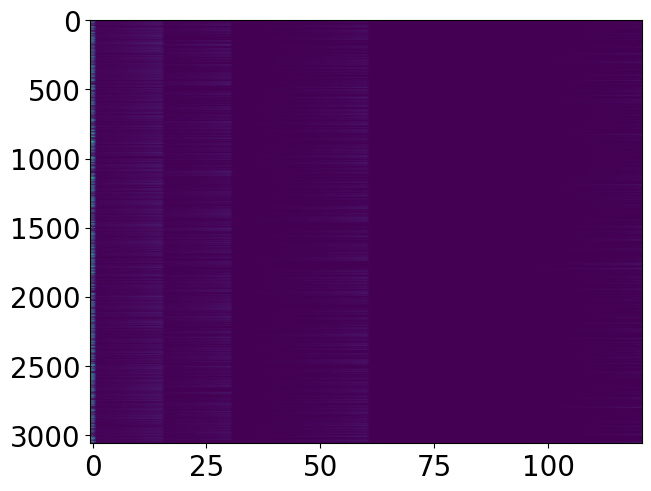

In [307]:
plt.imshow(Q0_exp.sum(1),aspect='auto')

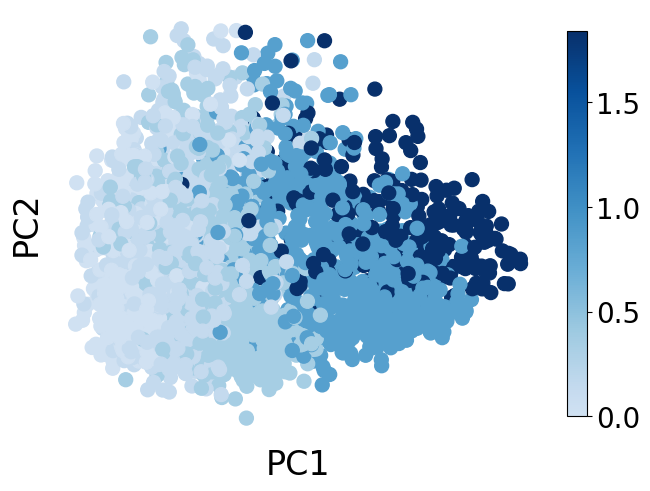

In [308]:
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=(Q0_exp.sum(1))@(np.linspace(0,2,m).reshape((-1,1))),cmap=cmap_y,s=100);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

In [309]:
topo = np.array([[0,1,2]])
tau = (0,1,2) # ~2 hours
traj = Trajectory(topo, tau, model="two_species_ss",verbose=1)
traj = traj.fit(X,warm_start=True,fit_tau=True,params=traj_params,Q=Q0,prior=Q0_exp,parallel=True,n_threads=10,epoch=100)
print(traj.elbos[-1])
traj_exp = copy.deepcopy(traj)

Reminder: provide genewise unspliced to spliced capture rate ratio in params with key Ub
fitting with warm start


100%|██████████| 100/100 [02:11<00:00,  1.31s/it]

-228.28928566461698


In [336]:
traj = copy.deepcopy(traj_exp)

[0.         0.82649833 2.        ]


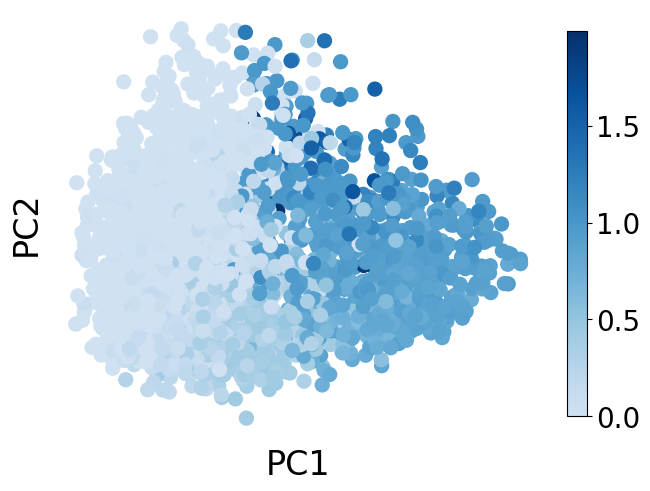

In [337]:
print(traj.tau)
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y,s=100);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

0.0
0.062210950913356614
0.19819303767568267
0.7632043099849078
1.0090516272111378


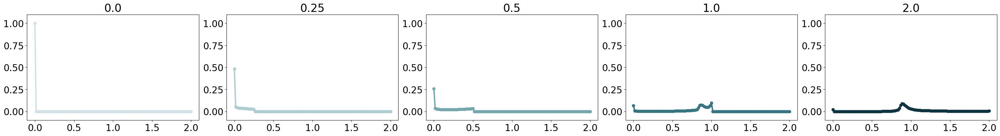

In [340]:
fig, ax = plt.subplots(1,len(Clusters),figsize=(6*len(Clusters),4))
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    ax[i].plot(traj.t,traj.Q[idx,0].mean(0),'.-',color=cmap_teal(i))
    ax[i].set_title(stage)
    ax[i].set_ylim((-0.1,1.1))
    print((traj.Q[idx,0]@traj.t).mean())

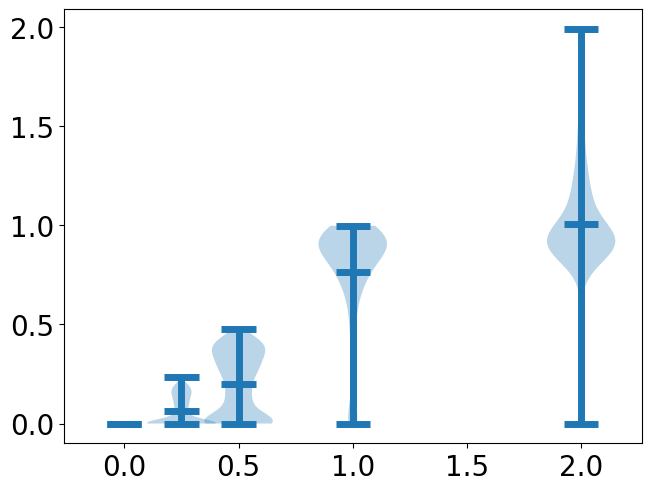

In [346]:
pos = Clusters
data=[]
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    data.append(traj.Q[idx,0]@traj.t)

plt.rcParams['lines.linewidth'] = 5.0
fig, axs = plt.subplots(1,1)
axs.violinplot(data, pos, widths=0.3,showmeans=True);

## Uniform prior

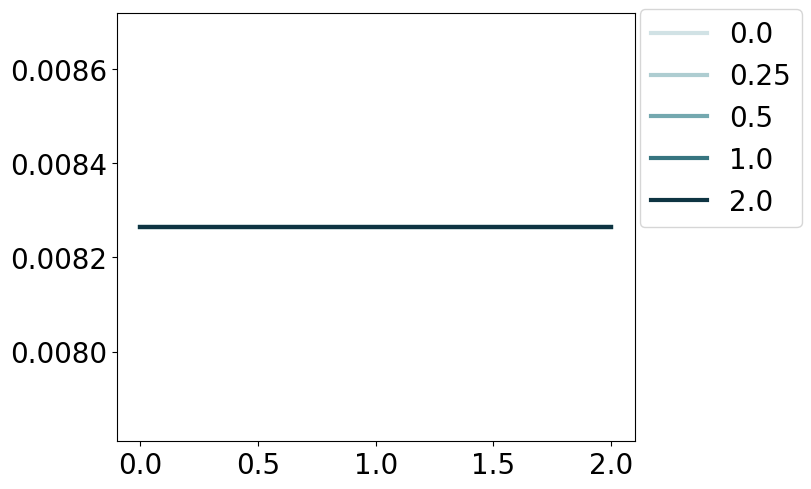

In [342]:
m=121

weight0 = np.ones((adata.n_obs,m))/m
fig, ax = plt.subplots(1,1,figsize=(8,4.8))
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    ax.plot(traj.t,weight0[idx,:][0,:],label=Cluster,color=cmap_teal(i))
ax.legend(loc=(1.01,0.5))
weight0=weight0/weight0.sum(axis=1,keepdims=True)
Q0_exp = weight0[:,None]

In [189]:
topo = np.array([[0,1,2]])
tau = (0,1,2) # ~2 hours
traj = Trajectory(topo, tau, model="two_species_ss",verbose=1)
traj = traj.fit(X,warm_start=True,fit_tau=True,params=traj_params,Q=Q0,parallel=True,n_threads=10,epoch=100)
print(traj.elbos[-1])
traj_uniform = copy.deepcopy(traj)

Reminder: provide genewise unspliced to spliced capture rate ratio in params with key Ub
fitting with warm start


100%|██████████| 100/100 [01:51<00:00,  1.11s/it]

-227.48538715962002


In [347]:
traj = copy.deepcopy(traj_uniform)

[0.         1.20620923 2.        ]


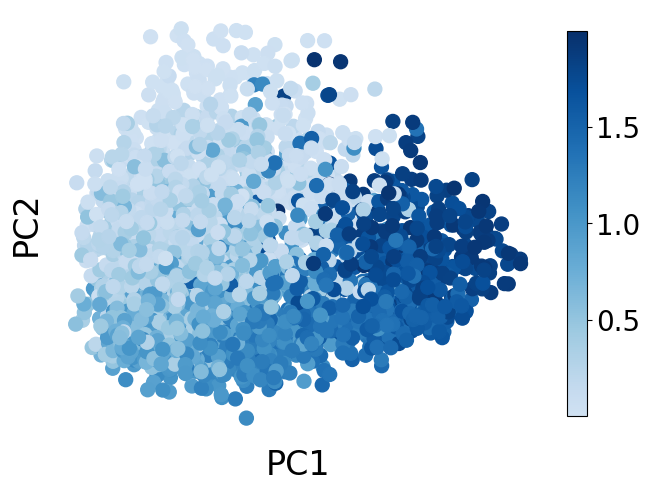

In [348]:
print(traj.tau)
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y,s=100);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

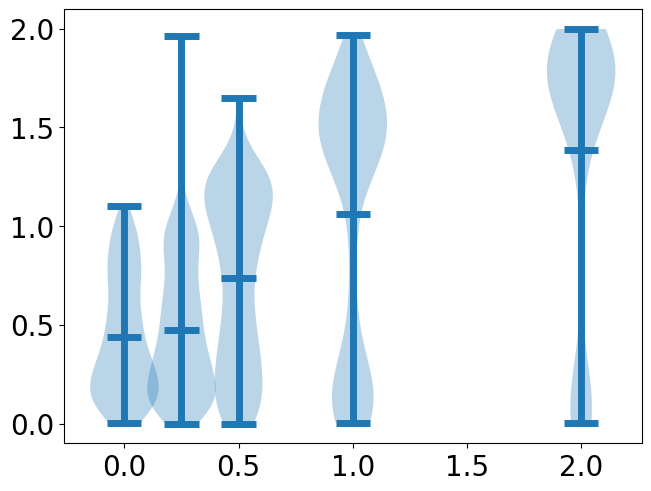

In [350]:
pos = Clusters
data=[]
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    data.append(traj.Q[idx,0]@traj.t)

plt.rcParams['lines.linewidth'] = 5.0
fig, axs = plt.subplots(1,1)
axs.violinplot(data, pos, widths=0.3,showmeans=True);

Text(0.02, 0.5, 'Density')

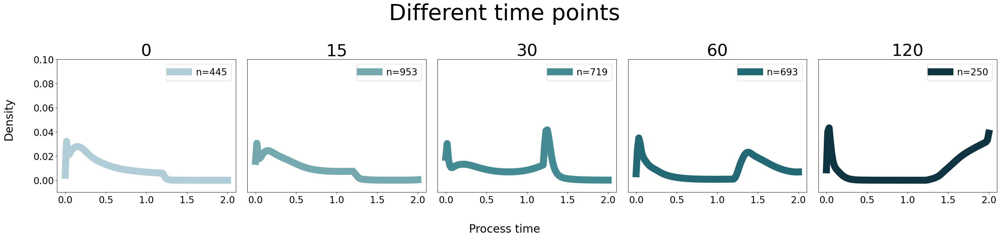

In [193]:
fig, ax = plt.subplots(1,len(Clusters),figsize=(6*len(Clusters),4))
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    ax[i].plot(traj.t,traj.Q[idx,0].mean(0),'.-',color=cmap_teal(i),linewidth=5)
    ax[i].set_title(stage)
    ax[i].set_ylim((0,1.1))
    print((traj.Q[idx,0]@traj.t).mean())

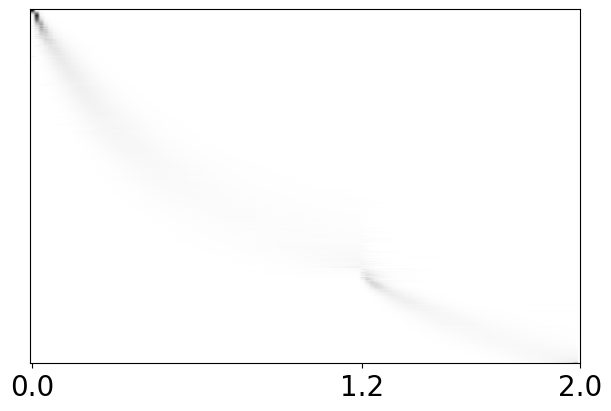

In [171]:
fig, ax = plt.subplots(1,1,figsize=(6,4))
ax=plot_t(traj,l=0,ax=ax,order_cells=True)
ax.set_yticks([]);

[]

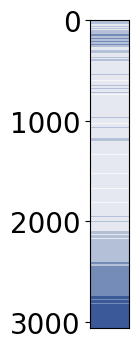

In [172]:
order = np.argsort(traj.Q[:,0]@traj.t)
cluster = np.zeros(adata.n_obs)
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    cluster[idx] = i
#plt.scatter(np.sum(t_grids[None,:]*weight0,axis=1),s,c=colors20[np.mod(clusters, 20)]);
fig, ax = plt.subplots(1,1,figsize=(0.5,4))
ax.imshow(cluster[order,None],aspect="auto",cmap=cmap_cluster)
ax.set_xticks([])

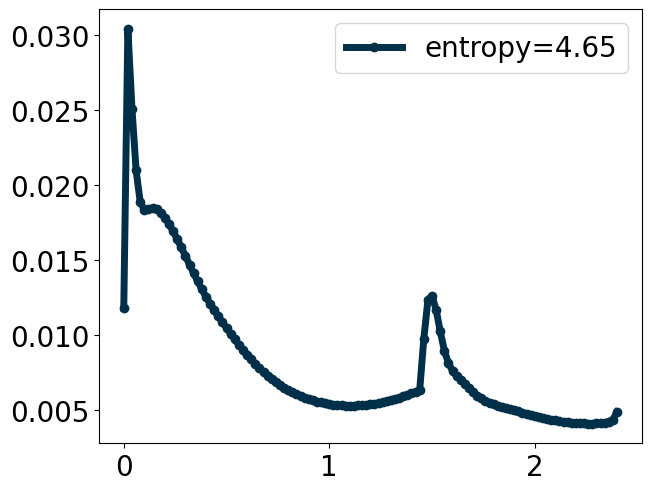

In [194]:
ax = plt.subplot()
ax.plot(traj.Q.sum((0,1))/traj.Q.sum(),'.-',color="#003049",linewidth=5,\
        label="entropy="+str(np.around(stats.entropy(traj.Q.sum((0,1))/traj.Q.sum()),2)));
x_label_list = ['0', '1', '2']
ax.set_xticks([0,50,100])
ax.set_xticklabels(x_label_list)
ax.legend()

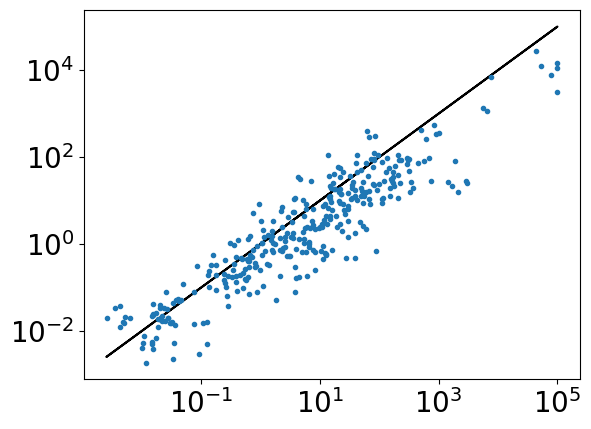

In [156]:
plt.loglog(traj.theta[:,[-2]],traj.theta[:,[-2]],'k');
plt.loglog(traj.theta[:,[-2]],traj.theta[:,[-1]],'.');

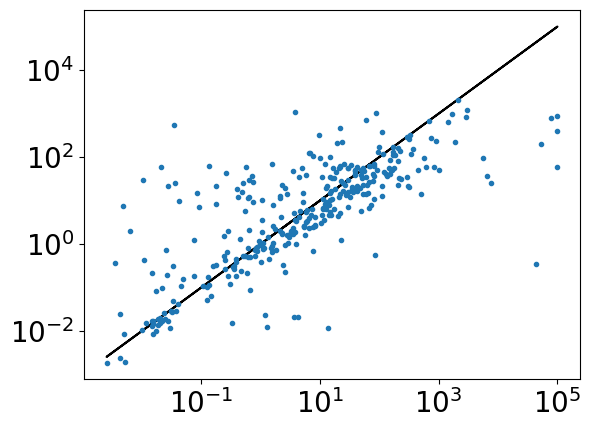

In [157]:
plt.loglog(traj_prior.theta[:,[-2]],traj_prior.theta[:,[-2]],'k');
plt.loglog(traj_prior.theta[:,[-2]],traj_ws.theta[:,[-2]],'.');

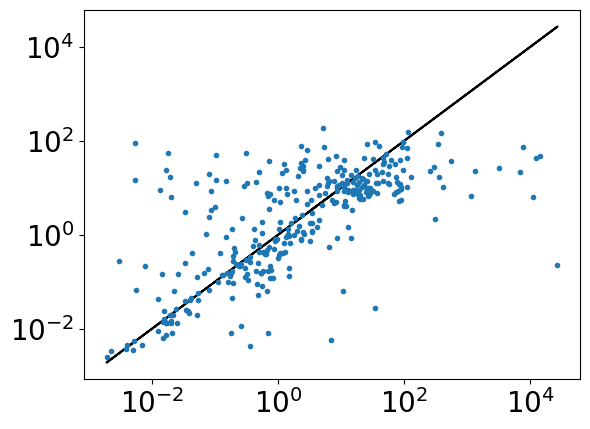

In [158]:
plt.loglog(traj_prior.theta[:,[-1]],traj_prior.theta[:,[-1]],'k');
plt.loglog(traj_prior.theta[:,[-1]],traj_ws.theta[:,[-1]],'.');

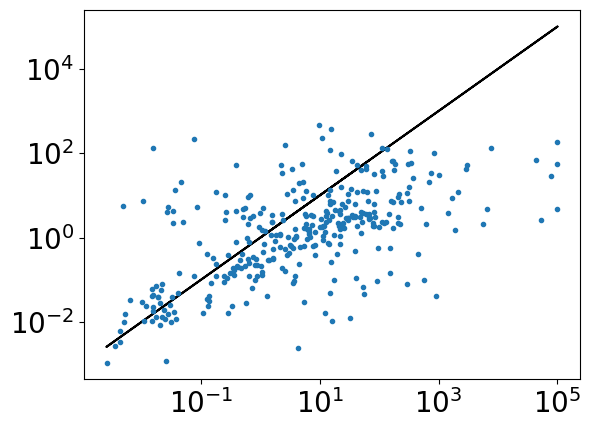

In [159]:
plt.loglog(traj.theta[:,[-2]],traj.theta[:,[-2]],'k');
plt.loglog(traj.theta[:,[-2]],traj_fix.theta[:,[-2]],'.');

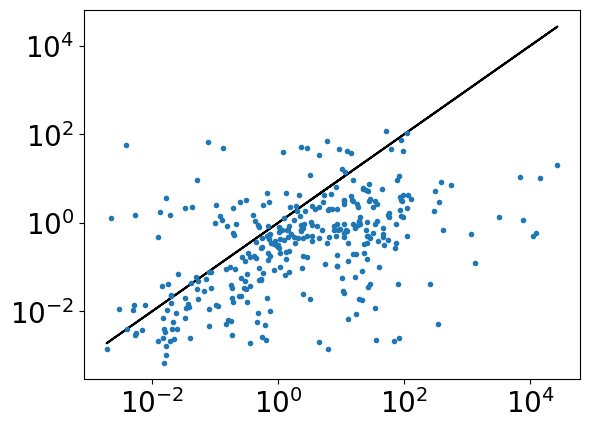

In [160]:
plt.loglog(traj.theta[:,[-1]],traj.theta[:,[-1]],'k');
plt.loglog(traj.theta[:,[-1]],traj_fix.theta[:,[-1]],'.');

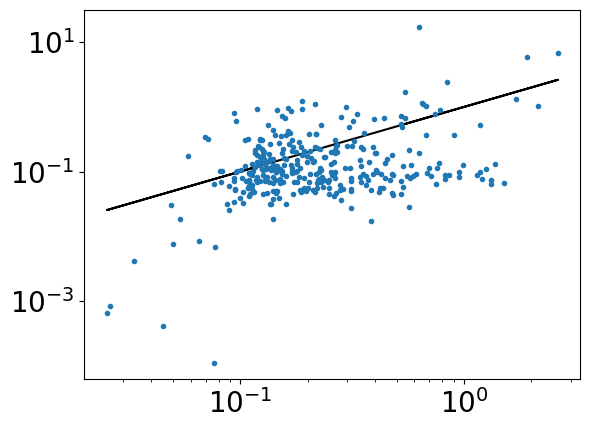

In [161]:
plt.loglog(traj.theta[:,0],traj.theta[:,0],'k');
plt.loglog(traj.theta[:,0],traj_fix.theta[:,0],'.');

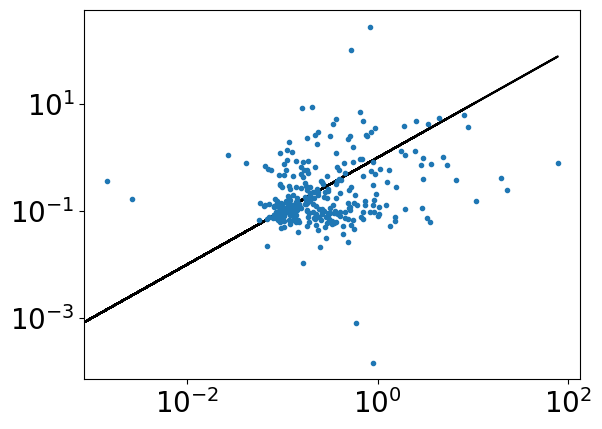

In [162]:
plt.loglog(traj.theta[:,2],traj.theta[:,2],'k');
plt.loglog(traj.theta[:,2],traj_fix.theta[:,2],'.');

[Text(0, 0, 'α0'), Text(1, 0, 'α1'), Text(2, 0, 'α2')]

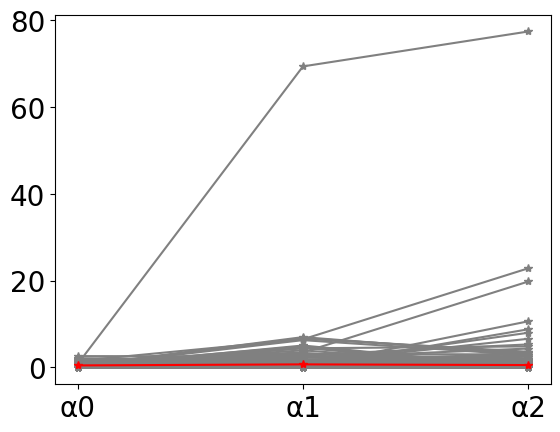

In [163]:
p=X.shape[1]
fig,ax = plt.subplots(1,1)
for j in range(p):
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='gray')
for j in plot_idx:
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='red')

x_label_list = ['α0', 'α1', 'α2']
ax.set_xticks([0,1,2])
ax.set_xticklabels(x_label_list)
#plt.yscale('log')

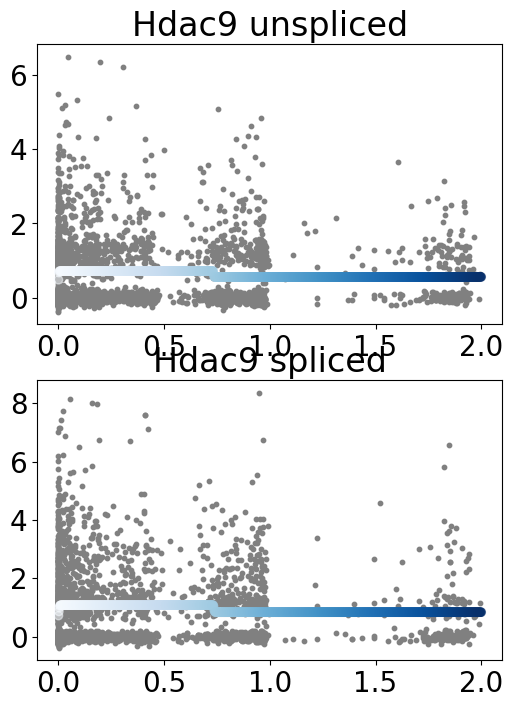

In [164]:
plot_y(traj,X=X/rd[:,None,None],idx=plot_idx,gene_name=fitted_genes);

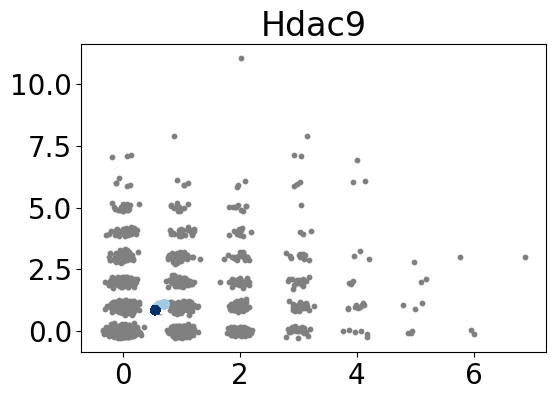

In [165]:
plot_phase(traj,X=X,idx=plot_idx,gene_name=fitted_genes);

In [166]:
alpha = traj.theta[:,:3]
DE_idx = np.where((alpha.max(axis=1)-alpha.min(axis=1))/np.sqrt(alpha.max(axis=1)) > 3)[0]
DE_idx

array([132, 160, 164, 206])

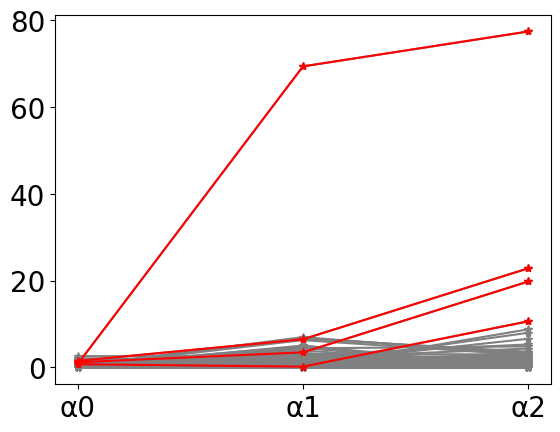

In [167]:
p=X.shape[1]
fig,ax = plt.subplots(1,1)
for j in range(p):
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='gray')
for j in DE_idx:
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='red')

x_label_list = ['α0', 'α1', 'α2']
ax.set_xticks([0,1,2]);
ax.set_xticklabels(x_label_list);
#plt.yscale('log')

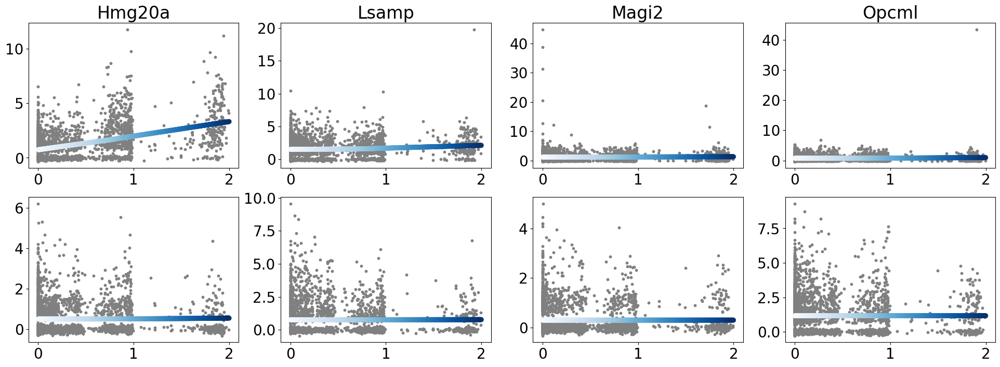

In [168]:
plot_y(traj,X=X/rd[:,None,None],idx=DE_idx,gene_name=fitted_genes);

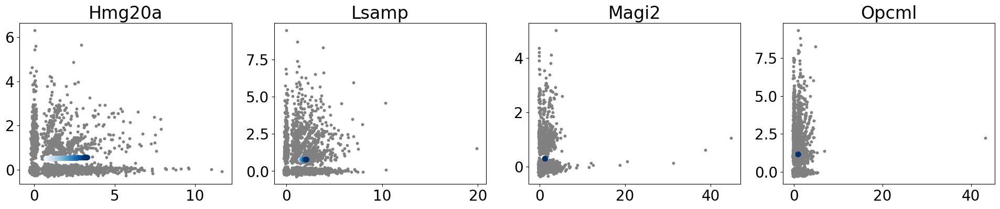

In [169]:
plot_phase(traj,X=X/rd[:,None,None],idx=DE_idx,gene_name=fitted_genes);

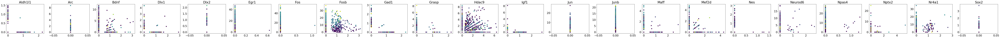

In [170]:
plot_marker_genes = marker_genes
fig,ax = plt.subplots(1,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),4))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[i].set_title(gene)
    ax[i].scatter(adata.layers["unspliced"].toarray()[:,j]/rd,adata.layers["spliced"].toarray()[:,j]/rd,c=traj.Q[:,0]@traj.t)

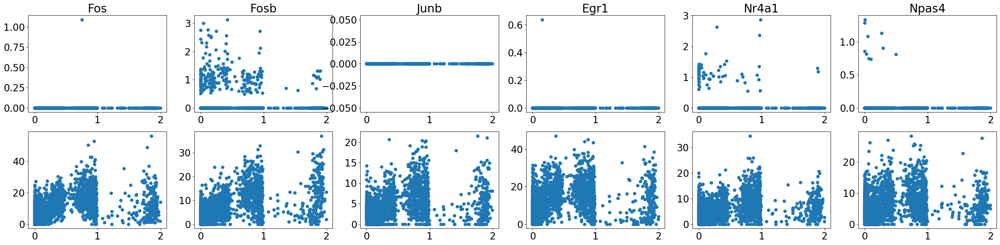

In [171]:
plot_marker_genes = IEG
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[0,i].set_title(gene)
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd)

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/scipy/interpolate/_fitpack2.py:298: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


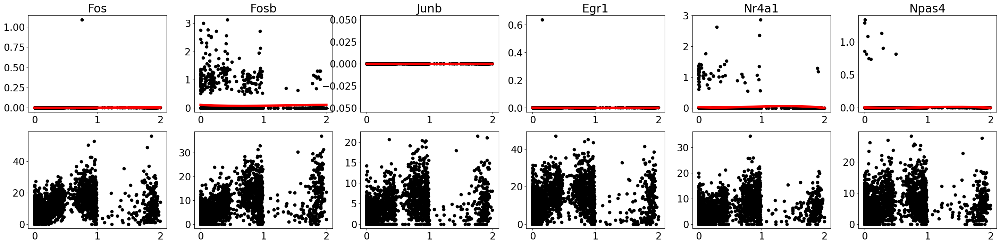

In [172]:
plot_marker_genes = IEG

t_hat = traj.Q[:,0]@traj.t
cell_order = np.argsort(t_hat)
x = t_hat[cell_order]
x_smooth = np.linspace(x.min(), x.max(), num=10)  # Generate a uniform grid for plotting    
    
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i in range(len(plot_marker_genes)):
    j = np.where(adata.var_names == plot_marker_genes[i])[0][0]
    y = adata.layers["unspliced"].toarray()[:,j]
    u_spline = UnivariateSpline(x, y, s=len(x)*1)
    y_smooth = u_spline(x_smooth)
    ax[0,i].plot(x_smooth, y_smooth, label='Smoothed Function',c='r',linewidth=5)
    ax[0,i].set_title(plot_marker_genes[i])
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd,color='k')
    
    z = adata.layers["spliced"].toarray()[:,j]
    s_spline = UnivariateSpline(x, z, s=len(x)*10)
    z_smooth = s_spline(x_smooth)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd,color='k')
    ax[1,i].plot(x_smooth, z_smooth, label='Smoothed Function',c='r',linewidth=5)

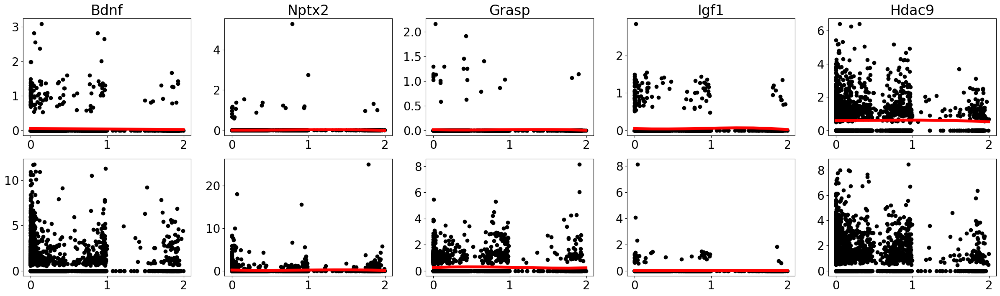

In [173]:
plot_marker_genes = LRG

t_hat = traj.Q[:,0]@traj.t
cell_order = np.argsort(t_hat)
x = t_hat[cell_order]
x_smooth = np.linspace(x.min(), x.max(), num=10)  # Generate a uniform grid for plotting    
    
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i in range(len(plot_marker_genes)):
    j = np.where(adata.var_names == plot_marker_genes[i])[0][0]
    y = adata.layers["unspliced"].toarray()[:,j]
    u_spline = UnivariateSpline(x, y, s=len(x)*1)
    y_smooth = u_spline(x_smooth)
    ax[0,i].plot(x_smooth, y_smooth, label='Smoothed Function',c='r',linewidth=5)
    ax[0,i].set_title(plot_marker_genes[i])
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd,color='k')
    
    z = adata.layers["spliced"].toarray()[:,j] 
    s_spline = UnivariateSpline(x, z, s=len(x)*1)
    z_smooth = s_spline(x_smooth)
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j]/rd,color='k')
    ax[1,i].plot(x_smooth, z_smooth, label='Smoothed Function',c='r',linewidth=5)

In [174]:
#from scipy.spatial import distance

#S = data.X.toarray()
#dist = distance.cdist(S, S, 'minkowski', p=1.)

#order = np.argsort(data.obs["t_hat"])
#sorted_dist = dist[order,:][:,order]
#plt.imshow(sorted_dist,aspect="auto");

#order = np.argsort(data.obs["celltype"])
#sorted_dist = dist[order,:][:,order]
#plt.imshow(sorted_dist,aspect="auto");

## Random starts with uniform prior

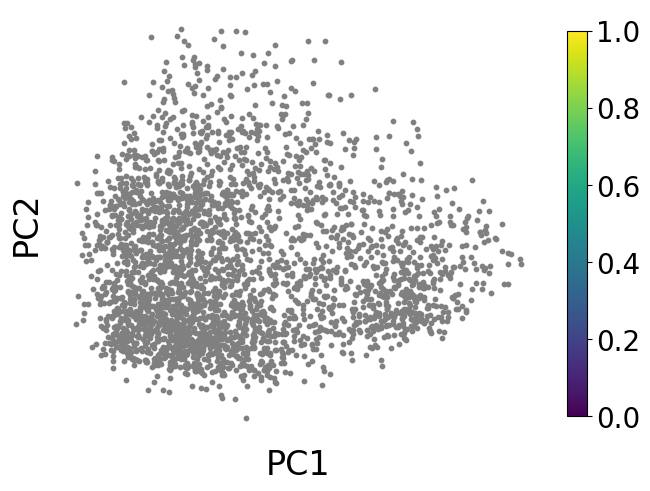

In [196]:
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c='gray',s=10);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

In [198]:
from multiprocessing import Pool

tau = (0,1,2)
topo = np.array([[0,1,2]])
Input_args = []
def fit_wrapper(seed):
    traj = Trajectory(topo, tau, model="two_species_ss", verbose=0)
    traj = traj.fit(X,m=100,n_init=1,fit_tau=True,params=traj_params,perm_theta=False,epoch=100,parallel=False,n_threads=1,seed=seed)
    return traj
    
for seed in range(100):
    Input_args.append([seed])
            
with Pool(50) as pool:      
    trajs_uniform = pool.starmap(fit_wrapper, Input_args, chunksize=1)

Text(0.5, 1.0, 'Random initialiazation')

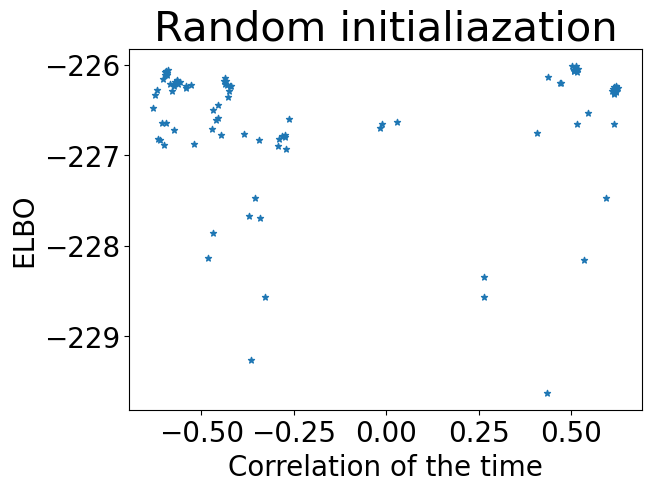

In [201]:
corrs = []
elbos = []

right_t = adata.obs.time
for traj in trajs_uniform:
    t_hat = traj.Q[:,0] @ traj.t
    corrs.append(pearsonr(right_t,t_hat)[0])
    elbos.append( traj.elbos[np.argmax([traj.elbos[i][-1] for i in range(len(traj.elbos))])][-1] )
plt.scatter(corrs,elbos,s=20,marker='*')
plt.xlabel('Correlation of the time',fontsize=20)
plt.ylabel('ELBO',fontsize=20)
plt.title('Random initialiazation',fontsize=30)

## Random starts with exp prior

In [199]:
from multiprocessing import Pool

tau = (0,1,2)
topo = np.array([[0,1,2]])
Input_args = []
def fit_wrapper(seed):
    traj = Trajectory(topo, tau, model="two_species_ss", verbose=0)
    traj = traj.fit(X,m=100,n_init=1,fit_tau=True,params=traj_params,prior=Q0_exp,perm_theta=False,epoch=100,parallel=False,n_threads=1,seed=seed)
    return traj
    
for seed in range(100):
    Input_args.append([seed])
            
with Pool(50) as pool:      
    trajs_exp = pool.starmap(fit_wrapper, Input_args, chunksize=1)

Text(0.5, 1.0, 'Random initialiazation')

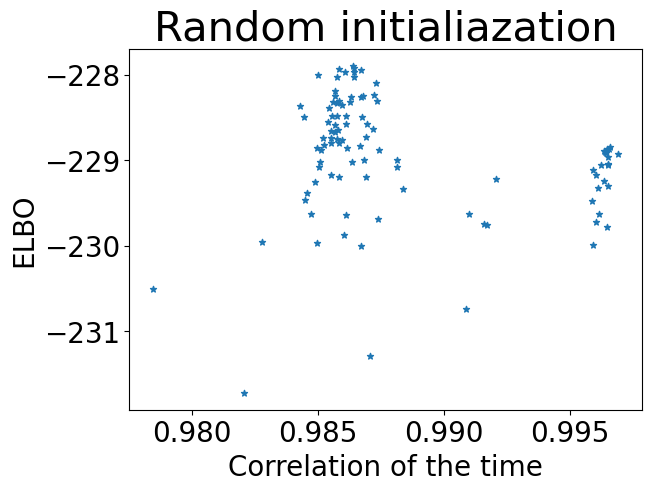

In [202]:
corrs = []
elbos = []

right_t = adata.obs.time
for traj in trajs_exp:
    t_hat = traj.Q[:,0] @ traj.t
    corrs.append(pearsonr(right_t,t_hat)[0])
    elbos.append( traj.elbos[np.argmax([traj.elbos[i][-1] for i in range(len(traj.elbos))])][-1] )
plt.scatter(corrs,elbos,s=20,marker='*')
plt.xlabel('Correlation of the time',fontsize=20)
plt.ylabel('ELBO',fontsize=20)
plt.title('Random initialiazation',fontsize=30)

In [200]:
import pickle 

with open('results/Neuron.pickle', 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    data = {'traj_delta':traj_delta,'traj_exp':traj_exp,'traj_uniform':traj_uniform,'trajs_exp':trajs_exp,'trajs_uniform':trajs_uniform}
    pickle.dump(data, f, pickle.HIGHEST_PROTOCOL)

In [203]:
traj = trajs_exp[np.argmax(elbos)]
np.max(elbos)

-227.8960511638763

[0.         0.73333693 2.        ]


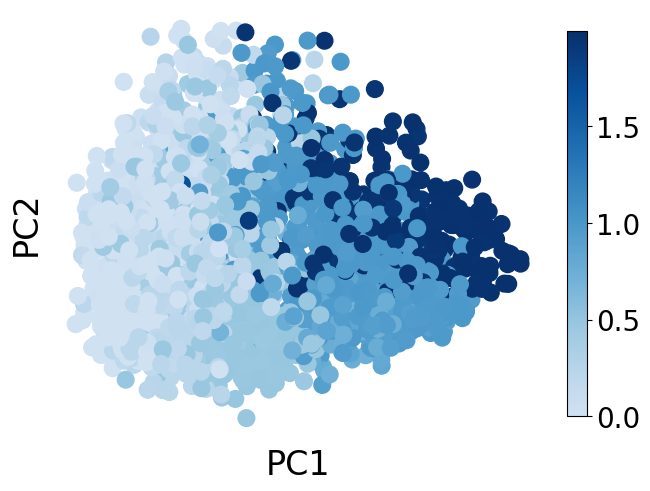

In [204]:
print(traj.tau)
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x_pca[:,0],x_pca[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

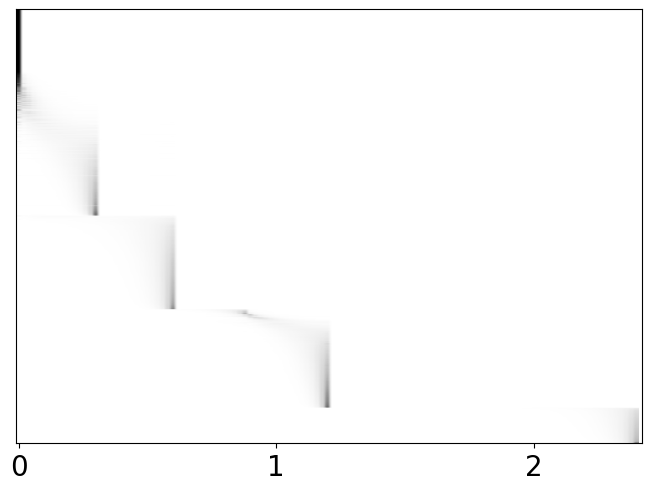

In [205]:
ax = plot_t(traj,l=0,order_cells=True)
x_label_list = ['0', '1', '2']
ax.set_xticks([0,50,100])
ax.set_xticklabels(x_label_list);
ax.set_yticks([]);

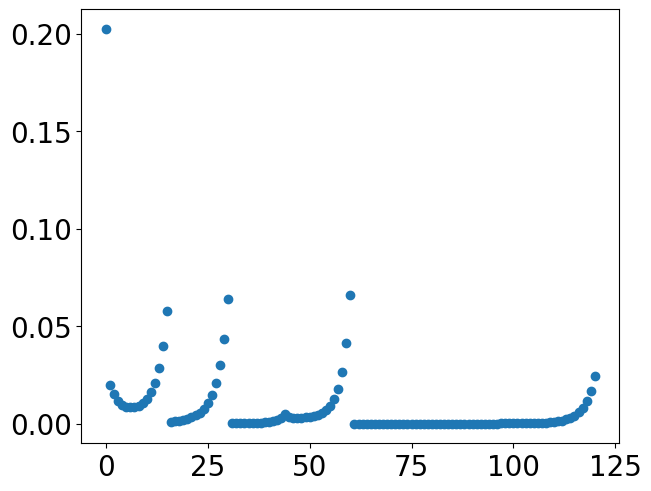

In [206]:
plt.plot(traj.Q.sum((0,1))/traj.Q.sum(),'.')

0.0
0.14434051460193772
0.42133738569884355
0.9352148281447915
1.9518702571293394


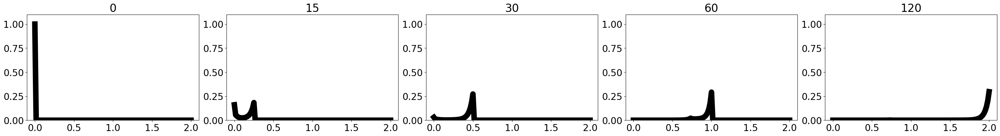

In [207]:
fig, ax = plt.subplots(1,len(Clusters),figsize=(6*len(Clusters),4))
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    ax[i].plot(traj.t,traj.Q[idx,0].mean(0),'k.-')
    ax[i].set_title(stage)
    ax[i].set_ylim((0,1.1))
    print((traj.Q[idx,0]@traj.t).mean())

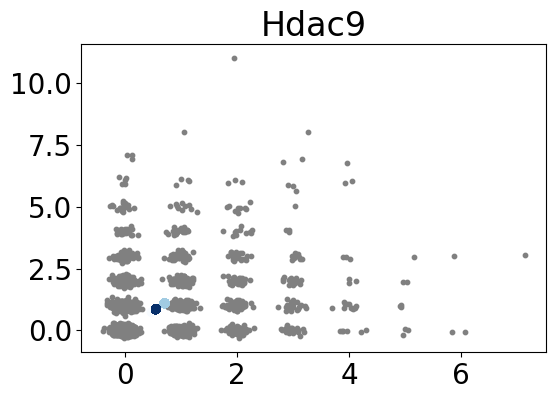

In [201]:
plot_phase(traj,idx=plot_idx,gene_name=fitted_genes);

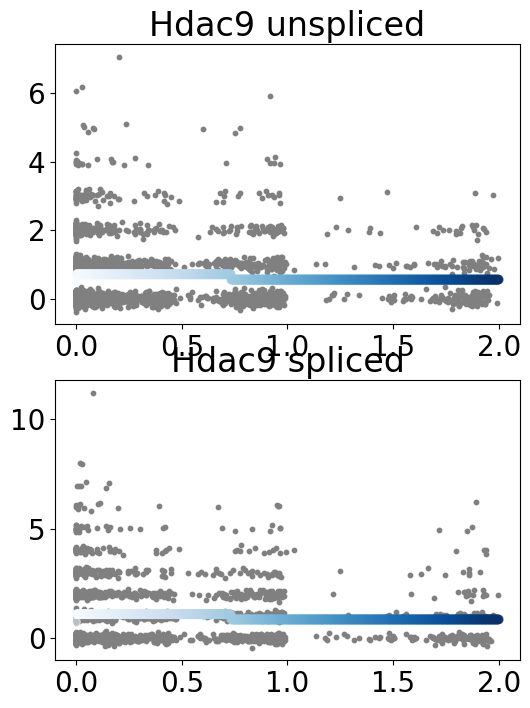

In [202]:
plot_y(traj,idx=plot_idx,gene_name=fitted_genes);

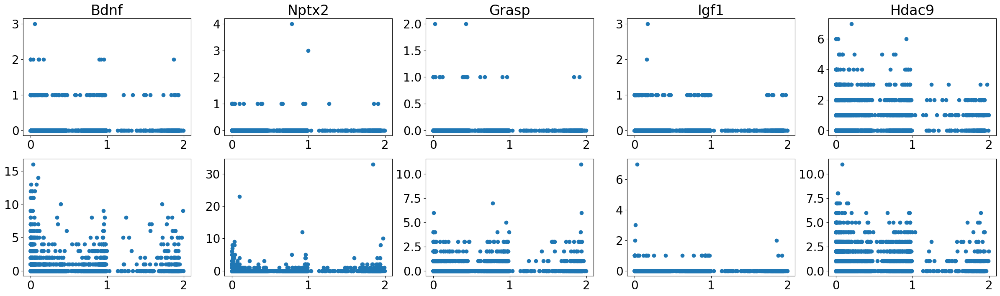

In [203]:
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[0,i].set_title(gene)
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j])
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j])

[Text(0, 0, 'α0'), Text(1, 0, 'α1'), Text(2, 0, 'α2')]

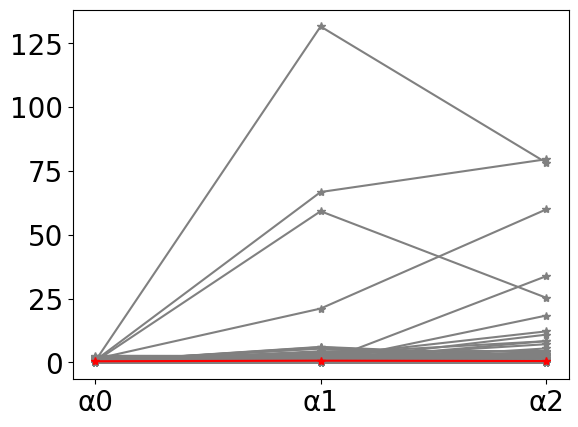

In [204]:
p=X.shape[1]
fig,ax = plt.subplots(1,1)
for j in range(p):
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='gray')
for j in plot_idx:
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='red')

x_label_list = ['α0', 'α1', 'α2']
ax.set_xticks([0,1,2])
ax.set_xticklabels(x_label_list)
#plt.yscale('log')

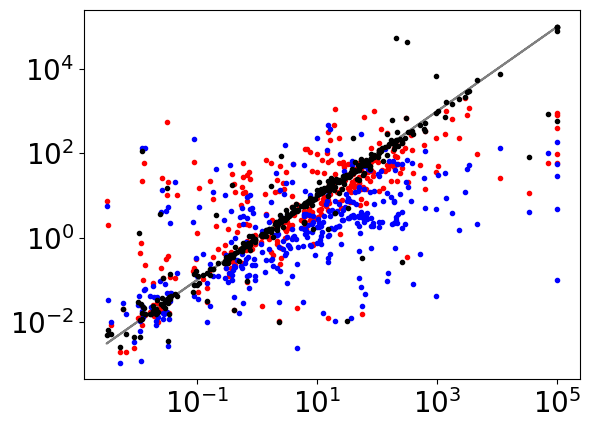

In [205]:
plt.loglog(traj.theta[:,[-2]],traj.theta[:,[-2]],'gray');
plt.loglog(traj.theta[:,[-2]],traj_ws.theta[:,[-2]],'r.',label=CCC(traj.theta[:,-2],traj_ws.theta[:,-2]));
plt.loglog(traj.theta[:,[-2]],traj_fix.theta[:,[-2]],'b.',label=CCC(traj.theta[:,-2],traj_fix.theta[:,-2]));
plt.loglog(traj.theta[:,[-2]],traj_prior.theta[:,[-2]],'k.',label=CCC(traj.theta[:,-2],traj_prior.theta[:,-2]));

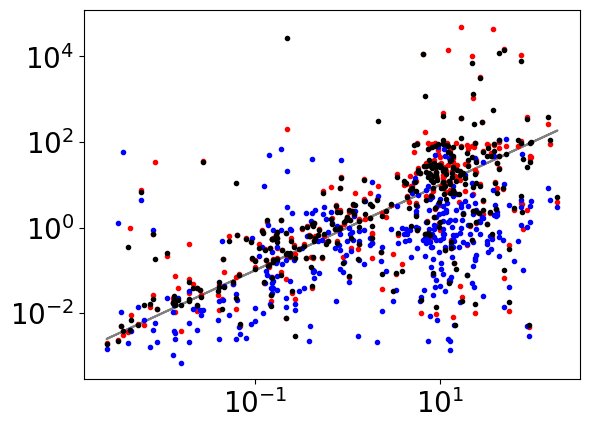

In [206]:
plt.loglog(traj_ws.theta[:,-1],traj_ws.theta[:,[-1]],'gray');
plt.loglog(traj_ws.theta[:,[-1]],traj.theta[:,[-1]],'r.',label=CCC(traj.theta[:,-1],traj_ws.theta[:,-1]));
plt.loglog(traj_ws.theta[:,[-1]],traj_fix.theta[:,[-1]],'b.',label=CCC(traj.theta[:,-1],traj_fix.theta[:,-1]));
plt.loglog(traj_ws.theta[:,[-1]],traj_prior.theta[:,[-1]],'k.',label=CCC(traj.theta[:,-1],traj_prior.theta[:,-1]));
#plt.legend()